# Load the data

In [2]:
#Processing
import pandas as pd
import numpy as np
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA, TruncatedSVD, FastICA
from sklearn.model_selection import KFold, cross_val_score
from sklearn.random_projection import GaussianRandomProjection, SparseRandomProjection
from sklearn.preprocessing import normalize
from sklearn.manifold import TSNE
from sklearn.metrics import roc_auc_score

#Plotting
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew

In [3]:
train = pd.read_csv('data/challenge2_train.csv')
test = pd.read_csv('data/challenge2_test.csv')

# Data Exploration and Preparation

## 1. Variable Identification
First, we want to know what kind of data we are dealing with by identifying the variables.

In [8]:
print(train.columns)
print(test.columns)

Index(['id', 'target', 'f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8',
       'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18',
       'f19', 'f20', 'f21', 'f22', 'f23', 'f24'],
      dtype='object')
Index(['id', 'f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10',
       'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20',
       'f21', 'f22', 'f23', 'f24'],
      dtype='object')


In [38]:
print('Size of training data: ', train.shape)
print('Size of test data: ', test.shape)

Size of training data:  (50000, 27)
Size of test data:  (50000, 26)


We have 25 features available as input to make a prediction, and 50 000 instances in both training and test set. We also have a target class in the training data, and IDs for every instance in the data.

In [11]:
train.info()
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 27 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      50000 non-null  int64  
 1   target  50000 non-null  int64  
 2   f0      45122 non-null  float64
 3   f1      50000 non-null  int64  
 4   f2      48816 non-null  float64
 5   f3      49677 non-null  float64
 6   f4      46621 non-null  object 
 7   f5      26130 non-null  float64
 8   f6      46648 non-null  float64
 9   f7      49517 non-null  float64
 10  f8      48540 non-null  object 
 11  f9      49497 non-null  float64
 12  f10     28585 non-null  float64
 13  f11     49894 non-null  float64
 14  f12     48487 non-null  object 
 15  f13     49497 non-null  float64
 16  f14     29937 non-null  float64
 17  f15     49057 non-null  float64
 18  f16     49020 non-null  float64
 19  f17     48630 non-null  object 
 20  f18     48749 non-null  float64
 21  f19     45121 non-null  float64
 22

In [36]:
train.head()

,id,target,f0,f1,f2,f3,f4,f5,f6,f7,...,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24
0,0,0,1013.1,0,5.0190,26.1,bbd,11.1,33.0,11.0,...,19.0,27.8,bbd,6.0,1008.9,1.0,nd,17.4,61.0,63.0
1,1,0,1010.2,1,5.0142,10.4,n,NaN,46.0,17.0,...,22.0,12.7,n,12.0,1012.4,5.0,nx,6.8,55.0,80.0
2,2,0,1014.4,2,5.0280,12.3,xnx,NaN,31.0,13.0,...,9.0,13.0,nnd,7.0,1016.1,NaN,nx,10.1,61.0,70.0
3,3,0,1019.2,3,5.0335,23.0,nx,11.6,41.0,9.0,...,17.0,32.3,nx,10.0,1016.6,1.0,dnd,14.4,NaN,40.0
4,4,0,1027.6,4,5.0129,7.3,d,7.3,28.0,15.0,...,13.0,13.7,dnd,7.0,1024.4,7.0,dbd,6.8,47.0,92.0


In [37]:
test.head()

,id,f0,f1,f2,f3,f4,f5,f6,f7,f8,...,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24
0,50000,1024.4,15,5.0256,6.6,xbx,0.8,20.0,2.0,o,...,13.0,11.4,xbx,0.0,1023.3,8.0,b,5.1,62.0,88.0
1,50001,1029.0,3,5.0289,5.6,nx,9.0,28.0,0.0,h,...,15.0,14.6,nnx,9.0,1025.9,1.0,NaN,0.0,42.0,89.0
2,50002,1016.7,10,5.0081,22.3,d,NaN,31.0,6.0,k,...,22.0,33.1,d,2.0,1012.3,NaN,bd,14.0,37.0,70.0
3,50003,1009.3,33,5.0168,11.3,bd,NaN,31.0,11.0,a,...,9.0,15.8,dbd,7.0,1005.3,8.0,dnd,9.8,NaN,96.0
4,50004,1027.1,37,5.0205,12.6,bx,12.6,22.0,6.0,d,...,7.0,21.1,nx,7.0,1024.5,1.0,bd,3.0,NaN,69.0


In [14]:
print('Number of target classes:', train['target'].nunique())
train['target'].head(15)

Number of target classes: 2


0     0
1     0
2     0
3     0
4     0
5     0
6     1
7     1
8     0
9     0
10    0
11    0
12    0
13    0
14    1
Name: target, dtype: int64

So, the target class is a binary class, containing 0 or 1 values. I don't know what they represent, but the task is thus to predict whether the instances in the test data is either of class 0 or 1.

We also see that the data includes some integer types, some float types and some object types which contain string values. Thus we have both numeric and categorical values in the data. The integer values can potentially be counts - or categorical if the number of unique integer values are within a small range.

We want to figure out how many categories each of these features include. Let's take a better look at each feature.

## 2. Univariate Analysis

In [41]:
train.nunique(axis=0)

id        50000
target        2
f0          505
f1           49
f2          413
f3          421
f4           16
f5          143
f6           62
f7           41
f8           15
f9            2
f10         278
f11         478
f12        1206
f13         486
f14          10
f15          41
f16         476
f17          16
f18          14
f19         495
f20          10
f21          16
f22         372
f23          30
f24         100
dtype: int64

In [42]:
test.nunique(axis=0)

id     50000
f0       508
f1        49
f2       412
f3       418
f4        16
f5       145
f6        64
f7        39
f8        15
f9         2
f10      271
f11      478
f12     1211
f13      475
f14        9
f15       40
f16      474
f17       16
f18       14
f19      506
f20        9
f21       16
f22      367
f23       30
f24      101
dtype: int64

In [44]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 27 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      50000 non-null  int64  
 1   target  50000 non-null  int64  
 2   f0      45122 non-null  float64
 3   f1      50000 non-null  int64  
 4   f2      48816 non-null  float64
 5   f3      49677 non-null  float64
 6   f4      46621 non-null  object 
 7   f5      26130 non-null  float64
 8   f6      46648 non-null  float64
 9   f7      49517 non-null  float64
 10  f8      48540 non-null  object 
 11  f9      49497 non-null  float64
 12  f10     28585 non-null  float64
 13  f11     49894 non-null  float64
 14  f12     48487 non-null  object 
 15  f13     49497 non-null  float64
 16  f14     29937 non-null  float64
 17  f15     49057 non-null  float64
 18  f16     49020 non-null  float64
 19  f17     48630 non-null  object 
 20  f18     48749 non-null  float64
 21  f19     45121 non-null  float64
 22

Seems like most of the categorical values have 16 unique categories, but f8 has 15 and f12 has 1206. Also worth noting that some of the integer types include only 10 unique values in the training data - but 9 in the test data. These could be categorical values with unseen values in the test data.

In [49]:
train['f12'].head()

0    be42001f3
1    3aad93cab
2    90116a97d
3    dc4ee566b
4    f09cc205f
Name: f12, dtype: object

In [51]:
train['f9'].head()

0    0.0
1    0.0
2    1.0
3    0.0
4    1.0
Name: f9, dtype: float64

The `f12` feature is hex values - and as it includes over 1200 unique values we can treat these as continuous values and convert them to float. It is also worth noting that f9 values are binary so this feature represents a variable which is either true or false.

In [132]:
# Define which columns include categorical data
cat_cols = ['f4', 'f8', 'f17', 'f21']

# Columns containing hex values
hex_col = 'f12'

bin_col = 'f9'

Let's convert the hex values to float values, and handle the categorical data later.

In [191]:
train['f12_dec'] = train['f12'].dropna().astype(str).apply(lambda x: int(x, 16))
test['f12_dec'] = test['f12'].dropna().astype(str).apply(lambda x: int(x, 16))

We will drop the hex values later.

### Missing values of features

In [71]:
train.isnull().sum()

id            0
target        0
f0         4878
f1            0
f2         1184
f3          323
f4         3379
f5        23870
f6         3352
f7          483
f8         1460
f9          503
f10       21415
f11         106
f12        1513
f13         503
f14       20063
f15         943
f16         980
f17        1370
f18        1251
f19        4879
f20       18755
f21        3584
f22         254
f23       24840
f24         602
dtype: int64

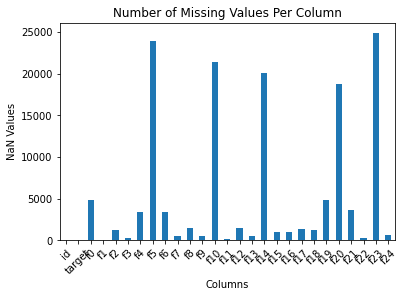

In [73]:
# plot missing data:
train.isnull().sum().plot(kind='bar')
# Add a title and show the plot.
plt.title('Number of Missing Values Per Column')
# Create tick mark labels on the Y axis and rotate them.
plt.xticks(rotation = 45)
# Create X axis label.
plt.xlabel("Columns")
# Create Y axis label.
plt.ylabel("NaN Values");

5 of the features have many missing values. We will look at how to impute these later.

### Target balance

Class 0: 38734
Class 1: 11266
Proportion: 3.44 : 1
Percentage Class 0: 77 %
Percentage Class 1: 23 %


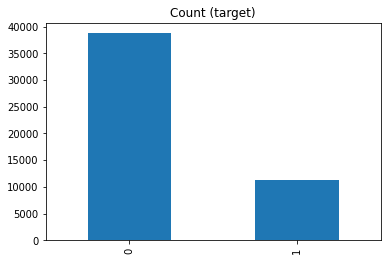

In [61]:
target_count = train.target.value_counts()
print('Class 0:', target_count[0])
print('Class 1:', target_count[1])
print('Proportion:', round(target_count[0] / target_count[1], 2), ': 1')
print('Percentage Class 0:', round(target_count[0]/train.shape[0]*100), '%')
print('Percentage Class 1:', round(target_count[1]/train.shape[0]*100), '%')

target_count.plot(kind='bar', title='Count (target)');

As we can see, the dataset is imbalanced with 77% of the instances being of class 0. This means that if the classifier predicted class 0 for all instances during validation, it would get an accuracy of 77 %.

### Finding duplicate rows

In [239]:
train.duplicated().apply(lambda x: x is True).sum()

0

No duplicated values! That is good, because the classifier can become biased bu duplicated data. There could still be correlated features, though.

### Statistical analysis

In [62]:
train.describe()

,id,target,f0,f1,f2,f3,f5,f6,f7,f9,...,f13,f14,f15,f16,f18,f19,f20,f22,f23,f24
count,50000.000000,50000.000000,45122.000000,50000.00000,48816.000000,49677.000000,26130.000000,46648.000000,49517.000000,49497.000000,...,49497.000000,29937.000000,49057.000000,49020.000000,48749.000000,45121.000000,31245.000000,49746.000000,25160.000000,49398.000000
mean,24999.500000,0.225320,1017.678647,23.49612,5.018887,16.998782,7.628550,40.050999,14.000848,0.222862,...,2.379215,4.508668,18.686630,21.683570,7.305524,1015.285913,4.428837,12.191203,52.013712,68.806470
std,14433.901067,0.417797,7.130390,14.01738,0.007177,6.520973,3.776794,13.655620,8.936280,0.416171,...,8.795403,2.717503,8.842879,6.970918,3.546719,7.057875,2.884968,6.414481,8.323467,19.024988
min,0.000000,0.000000,982.000000,0.00000,4.998000,-6.200000,0.000000,7.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,-5.100000,0.000000,978.200000,0.000000,-8.500000,37.000000,1.000000
25%,12499.750000,0.000000,1013.000000,11.00000,5.014000,12.300000,4.900000,31.000000,7.000000,0.000000,...,0.000000,2.000000,13.000000,16.600000,5.000000,1010.500000,1.000000,7.600000,45.000000,57.000000
50%,24999.500000,0.000000,1017.600000,23.00000,5.019100,16.700000,8.500000,39.000000,13.000000,0.000000,...,0.000000,5.000000,19.000000,21.100000,7.000000,1015.300000,5.000000,12.000000,52.000000,70.000000
75%,37499.250000,0.000000,1022.500000,35.00000,5.024100,21.600000,10.600000,48.000000,19.000000,0.000000,...,0.800000,7.000000,24.000000,26.500000,10.000000,1020.100000,7.000000,16.900000,59.000000,83.000000
max,49999.000000,1.000000,1040.900000,48.00000,5.045800,39.100000,14.300000,130.000000,87.000000,1.000000,...,371.000000,9.000000,87.000000,46.100000,13.000000,1038.500000,9.000000,33.900000,66.000000,100.000000


Some noteable things to observe:
- f2 has a very low standard deviation, which means its values are almost the same for every sample. If this feature has missing values, we could use this information to impute them. We could also try to transform this feature to get a new distribution.
- f6 has a high standard deviation
- many features has 0 as the minimum value - this could be a placeholder for a missing value or a human error.
- Several of the features have negative minimum values - is this an error? We will look at those features soon by plotting histograms of all values in e.g. f3, f16 and f22
- Some float typed features are actually integers
- Within f13, most of the values as 0, but maximum is 371. This could be an outlier.

In [63]:
test.describe()

,id,f0,f1,f2,f3,f5,f6,f7,f9,f10,...,f13,f14,f15,f16,f18,f19,f20,f22,f23,f24
count,50000.000000,45095.000000,50000.000000,48828.000000,49677.000000,25972.000000,46814.000000,49534.000000,49517.000000,28499.000000,...,49517.000000,29943.000000,49108.000000,49062.000000,48720.000000,45116.000000,31030.000000,49797.000000,25047.000000,49337.00000
mean,74999.500000,1017.673620,23.488000,5.018906,16.951901,7.607666,39.985389,14.016574,0.223236,5.465283,...,2.323263,4.514311,18.646901,21.662307,7.340394,1015.276014,4.432324,12.147728,51.956801,68.86803
std,14433.901067,7.109979,14.040715,0.007166,6.481997,3.794703,13.597521,8.888472,0.416420,4.172868,...,8.297317,2.724323,8.810681,6.923556,3.543402,7.049542,2.897262,6.393228,8.338472,19.07522
min,50000.000000,980.500000,0.000000,4.996400,-5.300000,0.000000,6.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,-4.000000,0.000000,977.100000,0.000000,-8.200000,37.000000,0.00000
25%,62499.750000,1013.000000,11.000000,5.014100,12.200000,4.800000,31.000000,7.000000,0.000000,2.600000,...,0.000000,2.000000,13.000000,16.600000,5.000000,1010.500000,1.000000,7.500000,45.000000,57.00000
50%,74999.500000,1017.700000,23.000000,5.019100,16.700000,8.400000,39.000000,13.000000,0.000000,4.600000,...,0.000000,5.000000,19.000000,21.100000,7.000000,1015.300000,5.000000,12.000000,52.000000,70.00000
75%,87499.250000,1022.400000,35.000000,5.024000,21.500000,10.600000,48.000000,19.000000,0.000000,7.400000,...,0.800000,7.000000,24.000000,26.375000,10.000000,1020.000000,7.000000,16.800000,59.000000,83.00000
max,99999.000000,1041.000000,48.000000,5.043800,39.400000,14.500000,126.000000,83.000000,1.000000,86.200000,...,278.400000,8.000000,83.000000,46.200000,13.000000,1039.600000,8.000000,30.700000,66.000000,100.00000


It looks like both the training and test set have about the same feature distributions.

### Visualize the data

First, we plot the frequency of values of the numerical features

array([[<AxesSubplot:title={'center':'id'}>,
        <AxesSubplot:title={'center':'target'}>,
        <AxesSubplot:title={'center':'f0'}>],
       [<AxesSubplot:title={'center':'f1'}>,
        <AxesSubplot:title={'center':'f2'}>,
        <AxesSubplot:title={'center':'f3'}>],
       [<AxesSubplot:title={'center':'f5'}>,
        <AxesSubplot:title={'center':'f6'}>,
        <AxesSubplot:title={'center':'f7'}>],
       [<AxesSubplot:title={'center':'f9'}>,
        <AxesSubplot:title={'center':'f10'}>,
        <AxesSubplot:title={'center':'f11'}>],
       [<AxesSubplot:title={'center':'f13'}>,
        <AxesSubplot:title={'center':'f14'}>,
        <AxesSubplot:title={'center':'f15'}>],
       [<AxesSubplot:title={'center':'f16'}>,
        <AxesSubplot:title={'center':'f18'}>,
        <AxesSubplot:title={'center':'f19'}>],
       [<AxesSubplot:title={'center':'f20'}>,
        <AxesSubplot:title={'center':'f22'}>,
        <AxesSubplot:title={'center':'f23'}>],
       [<AxesSubplot:title={'cent

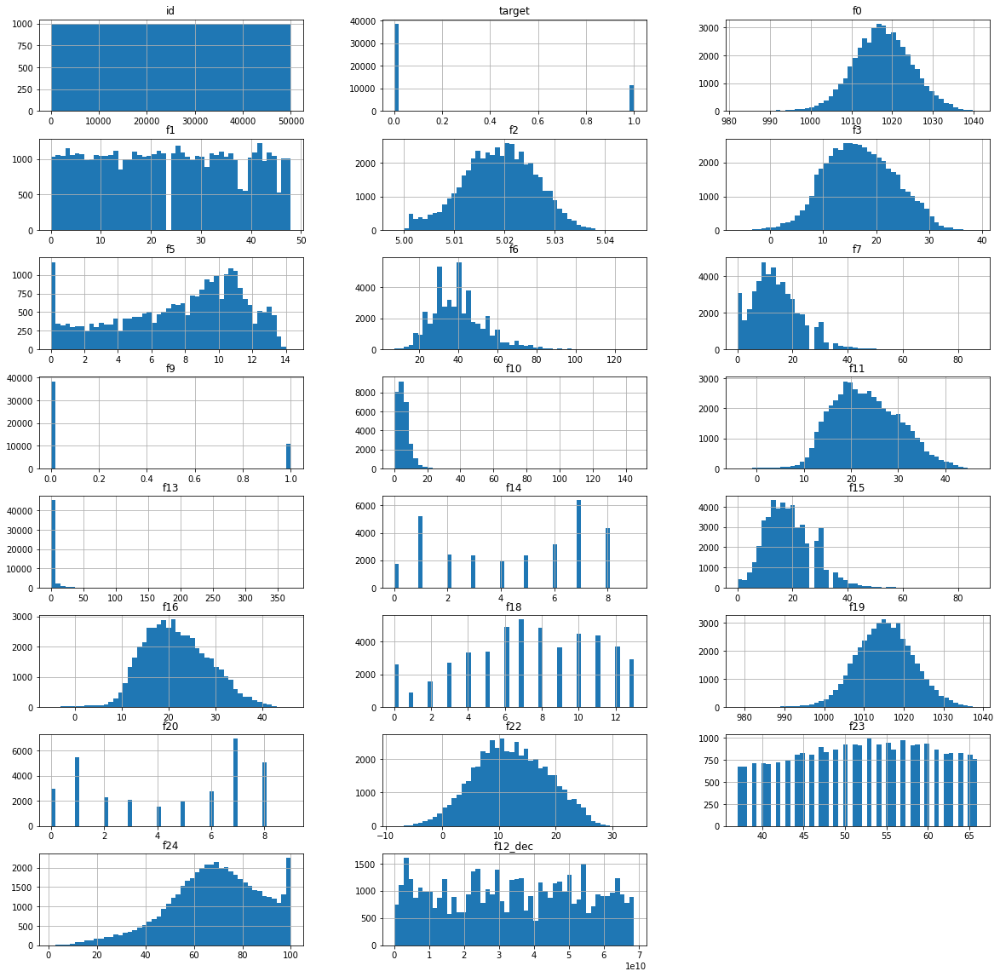

In [152]:
numerical_features_plots = train.hist(bins=50, figsize=(20,20), layout=(8,3))
numerical_features_plots

Some additional interesting observations about the numerical data:
- The distribution of f9 looks very similar to the target distribution - they might be correlated.
- f5 has a high frequency of 0 values - this could be placeholder for missing values. There are also periodical drops in frequency for even numbers. It could be interesting to look at a new feautre x mod 2 for f5
- f24 has a high frequency of values close to 100. It looks like there is a cap on maximum value for this feature.
- f10 and f13 have narrow distributions, and it looks like they include outliers
- f14, f18 and f20 must represent counts or categorical data
- f23 has an interesting distribution. It could be a transformation of the other features.

I will look closer at f23:

In [142]:
train.f23.describe()

count    25160.000000
mean        52.013712
std          8.323467
min         37.000000
25%         45.000000
50%         52.000000
75%         59.000000
max         66.000000
Name: f23, dtype: float64

f23 is actually integer-valued with values in the interval 37-66.

<AxesSubplot:ylabel='Frequency'>

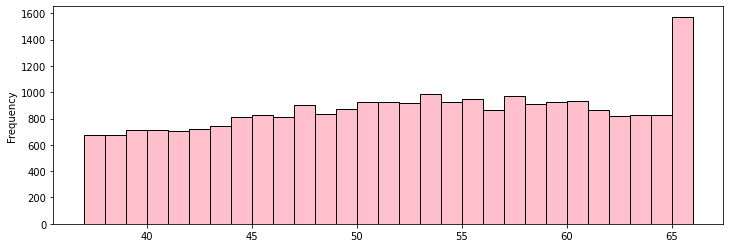

In [143]:
train['f23'].plot(kind='hist', bins=(66-37), figsize=(12,4), facecolor='pink',edgecolor='black')

This kind of data could represent something like age.

Lets plot the frequency of the categorical data:

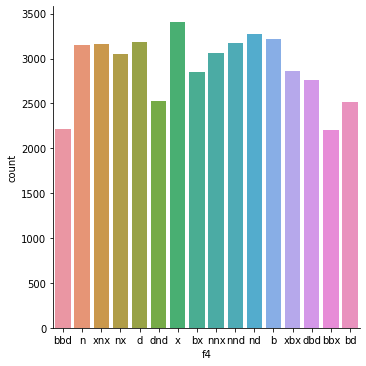

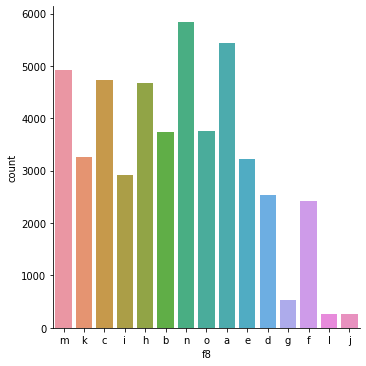

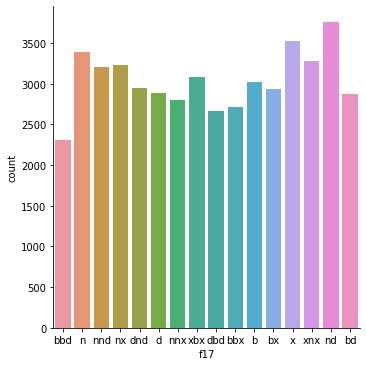

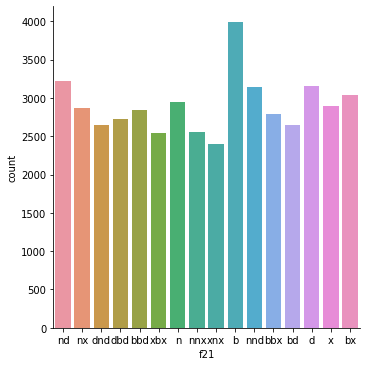

In [155]:
for col in cat_cols:
    sns.catplot(x=col, kind="count", data=train)

It looks like most of the values are evenly distributed, but for f8 we see that there are fewer of the categories d-j.

### Plot the mean

Most of them are in the same range, except for f0, f12_dec and f19. Let's remove them to better look at the others.

In [ ]:
train.drop(['id', 'f0', 'f12_dec', 'f19'], axis=1).mean().sort_values().plot(style='*', color='red')

## 3. Bi-variate analysis

### Correlation between variables

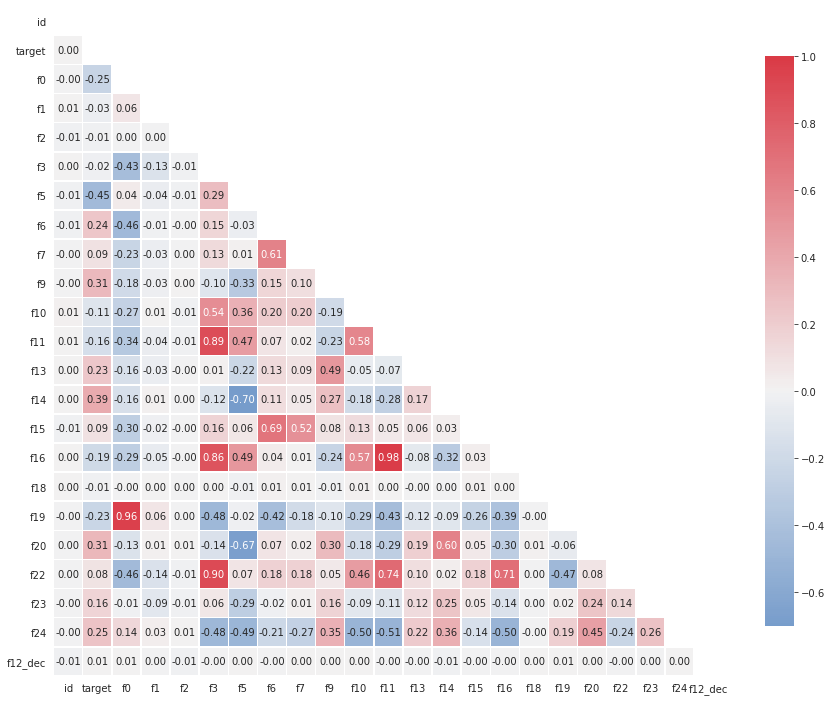

<Figure size 432x288 with 0 Axes>

In [180]:
correlations = train.corr()

fig, ax = plt.subplots(figsize=(15,15))
sns.set_style(style = 'white')
cmap = sns.diverging_palette(250, 10, as_cmap=True)
mask = np.triu(np.ones_like(correlations, dtype=np.bool))
heatmap = sns.heatmap(correlations, vmax=1.0, center=0, fmt='.2f', cmap=cmap, mask=mask,
        square=True, linewidths=.5, annot=True, cbar_kws={"shrink": .70})
plt.show();
plt.savefig('heatmap.png')

This table has some interesting information. Many of the features are correlated, as presented in this list:

- **f0** - **f19**
- **f3** - f11, f16, **f22**
- f5 - f14, f20
- f6 - f7, f15
- f7 - f15
- f9 - f13
- **f11** - **f16**, f22, f24
- f14 - f20
- f16 - f22

The bold features are either highly positively or highly negativley correlated. The features f0 and f19, f3 and f22, and f11 and f16 are have correlation of 0.9 or above. This implies that the features are redundant of each other, and might cause overfitting. We can potentially remove one of them during feature engineering.

In [183]:
colors = {0.0:'orange', 1.0:'green'}

<AxesSubplot:xlabel='target', ylabel='f9'>

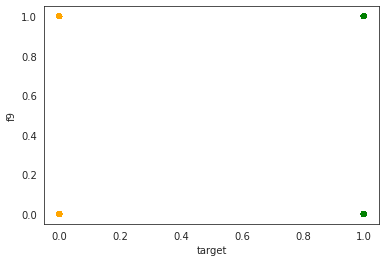

In [311]:
train.plot(kind='scatter', x='target', y='f9', color=train['target'].apply(lambda x: colors[x]))

In [ ]:
train.plot(kind='scatter', x='target', y='f9', color=train['target'].apply(lambda x: colors[x]))

### Scatterplots of features

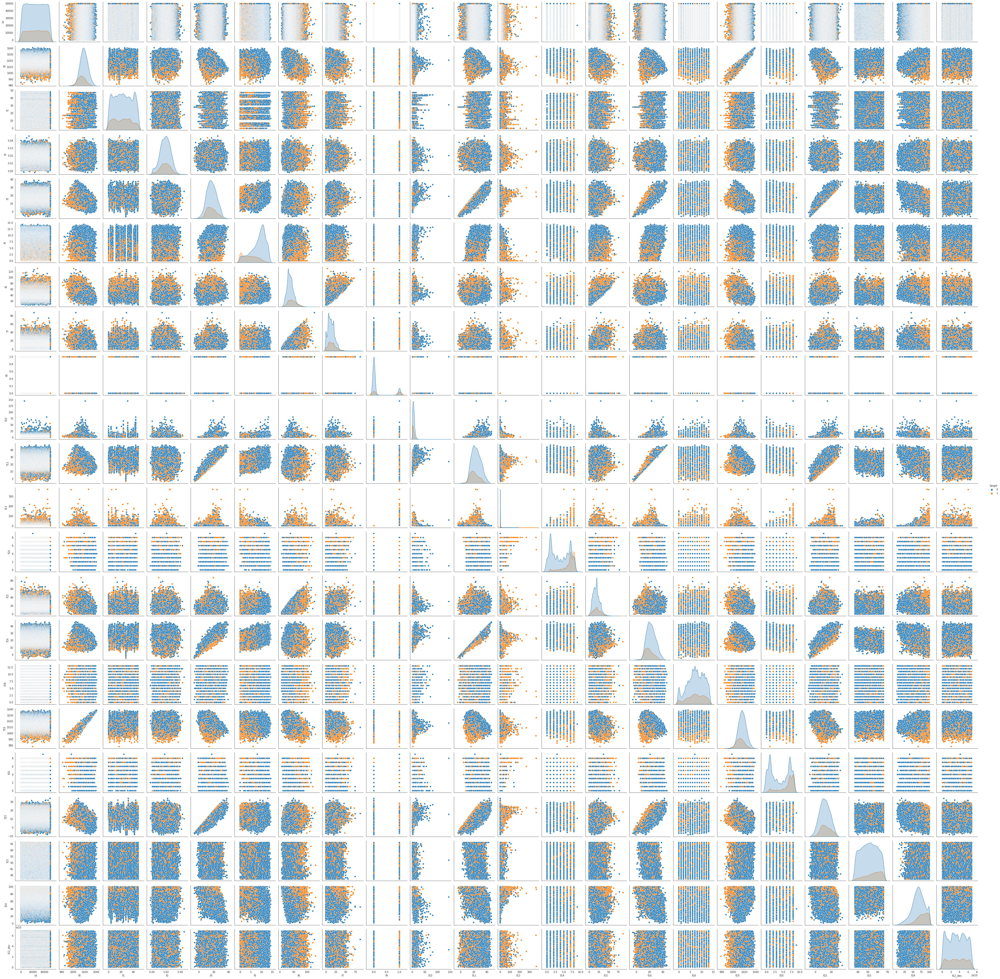

In [182]:
sns_plot = sns.pairplot(train, hue='target')
sns_plot.savefig('pairplot.png')
sns_plot

### Box plots
Let's find those outliers.

<AxesSubplot:>

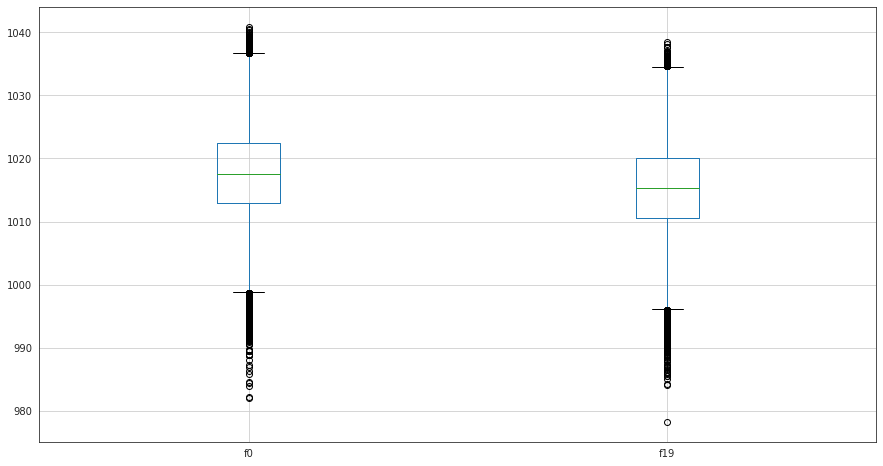

In [235]:
train.boxplot(['f0', 'f19'], figsize=(15,8))

<AxesSubplot:>

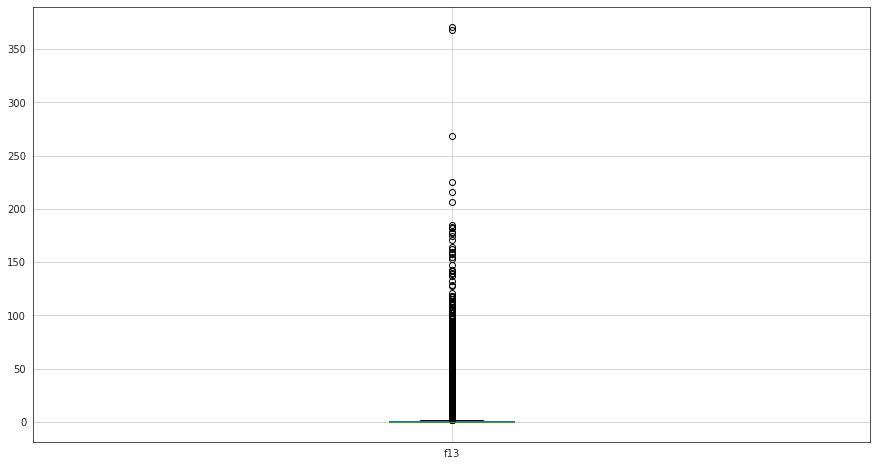

In [229]:
train.boxplot('f13', figsize=(15,8))

<AxesSubplot:>

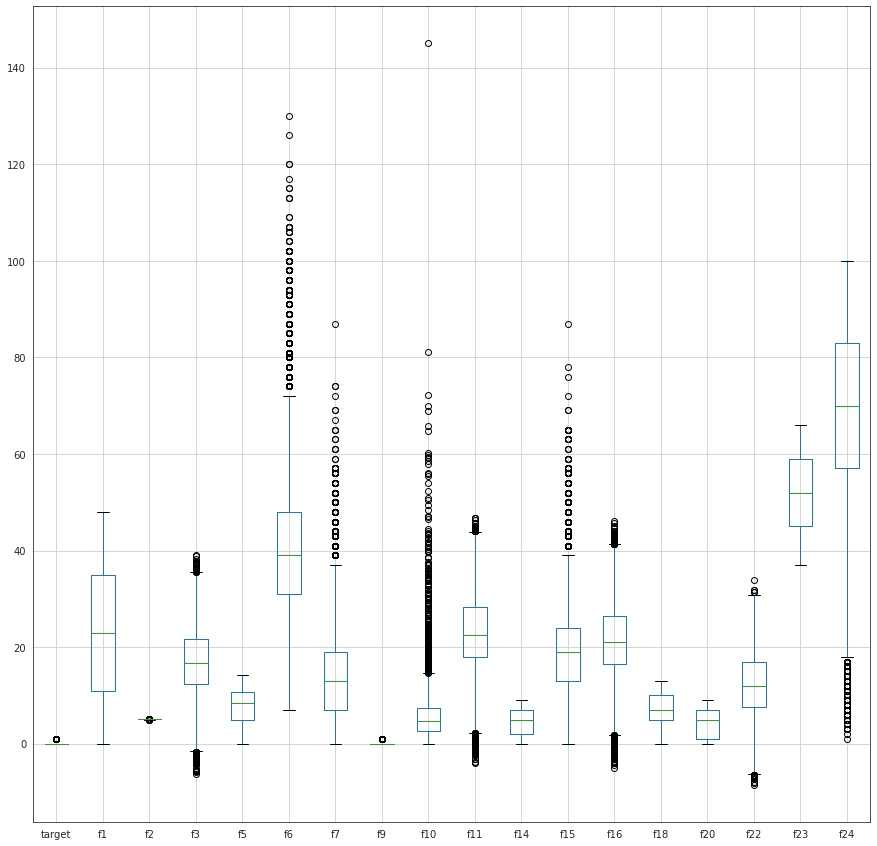

In [233]:
train.boxplot([x for x in train.drop(['id', 'f0', 'f19', 'f13', 'f12', 'f21', 'f8', 'f4', 'f17', 'f12_dec'],axis=1).columns], figsize=(15,15))

<AxesSubplot:>

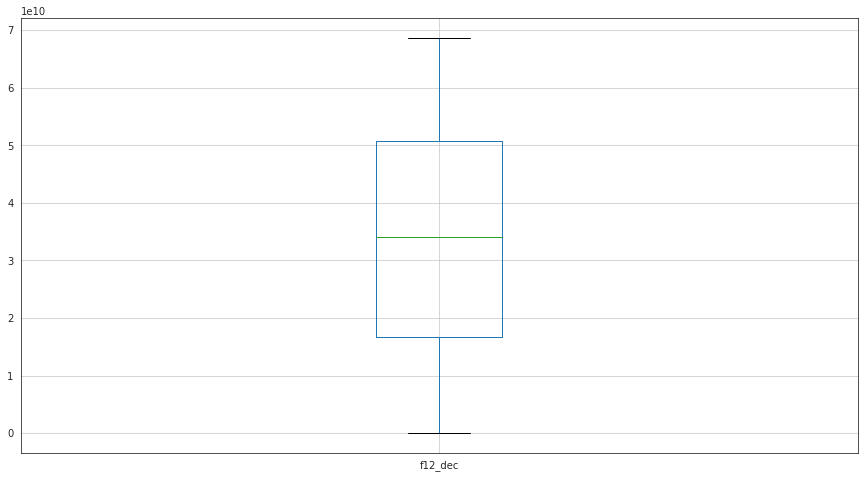

In [236]:
train.boxplot('f12_dec', figsize=(15,8))

# Preprocessing the data

## Encoding categorical values

In [187]:
train_encoded = train.copy()
train_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 28 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       50000 non-null  int64  
 1   target   50000 non-null  int64  
 2   f0       45122 non-null  float64
 3   f1       50000 non-null  int64  
 4   f2       48816 non-null  float64
 5   f3       49677 non-null  float64
 6   f4       46621 non-null  object 
 7   f5       26130 non-null  float64
 8   f6       46648 non-null  float64
 9   f7       49517 non-null  float64
 10  f8       48540 non-null  object 
 11  f9       49497 non-null  float64
 12  f10      28585 non-null  float64
 13  f11      49894 non-null  float64
 14  f12      48487 non-null  object 
 15  f13      49497 non-null  float64
 16  f14      29937 non-null  float64
 17  f15      49057 non-null  float64
 18  f16      49020 non-null  float64
 19  f17      48630 non-null  object 
 20  f18      48749 non-null  float64
 21  f19      451

In [188]:
for i in cat_cols:
    train_encoded = pd.concat([train_encoded, pd.get_dummies(train[i], prefix=i)], axis=1)
    train_encoded.drop([i], axis=1, inplace=True)

In [190]:
train_encoded.columns

Index(['id', 'target', 'f0', 'f1', 'f2', 'f3', 'f5', 'f6', 'f7', 'f9', 'f10',
       'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f18', 'f19', 'f20', 'f22',
       'f23', 'f24', 'f12_dec', 'f4_b', 'f4_bbd', 'f4_bbx', 'f4_bd', 'f4_bx',
       'f4_d', 'f4_dbd', 'f4_dnd', 'f4_n', 'f4_nd', 'f4_nnd', 'f4_nnx',
       'f4_nx', 'f4_x', 'f4_xbx', 'f4_xnx', 'f8_a', 'f8_b', 'f8_c', 'f8_d',
       'f8_e', 'f8_f', 'f8_g', 'f8_h', 'f8_i', 'f8_j', 'f8_k', 'f8_l', 'f8_m',
       'f8_n', 'f8_o', 'f17_b', 'f17_bbd', 'f17_bbx', 'f17_bd', 'f17_bx',
       'f17_d', 'f17_dbd', 'f17_dnd', 'f17_n', 'f17_nd', 'f17_nnd', 'f17_nnx',
       'f17_nx', 'f17_x', 'f17_xbx', 'f17_xnx', 'f21_b', 'f21_bbd', 'f21_bbx',
       'f21_bd', 'f21_bx', 'f21_d', 'f21_dbd', 'f21_dnd', 'f21_n', 'f21_nd',
       'f21_nnd', 'f21_nnx', 'f21_nx', 'f21_x', 'f21_xbx', 'f21_xnx'],
      dtype='object')

In [192]:
test_encoded = test
test_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 27 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       50000 non-null  int64  
 1   f0       45095 non-null  float64
 2   f1       50000 non-null  int64  
 3   f2       48828 non-null  float64
 4   f3       49677 non-null  float64
 5   f4       46797 non-null  object 
 6   f5       25972 non-null  float64
 7   f6       46814 non-null  float64
 8   f7       49534 non-null  float64
 9   f8       48473 non-null  object 
 10  f9       49517 non-null  float64
 11  f10      28499 non-null  float64
 12  f11      49881 non-null  float64
 13  f12      48543 non-null  object 
 14  f13      49517 non-null  float64
 15  f14      29943 non-null  float64
 16  f15      49108 non-null  float64
 17  f16      49062 non-null  float64
 18  f17      48728 non-null  object 
 19  f18      48720 non-null  float64
 20  f19      45116 non-null  float64
 21  f20      310

In [193]:
for i in cat_cols:
    test_encoded = pd.concat([test_encoded, pd.get_dummies(test[i], prefix=i)], axis=1)
    test_encoded.drop(i, axis=1, inplace=True)

In [194]:
test_encoded.columns

Index(['id', 'f0', 'f1', 'f2', 'f3', 'f5', 'f6', 'f7', 'f9', 'f10', 'f11',
       'f12', 'f13', 'f14', 'f15', 'f16', 'f18', 'f19', 'f20', 'f22', 'f23',
       'f24', 'f12_dec', 'f4_b', 'f4_bbd', 'f4_bbx', 'f4_bd', 'f4_bx', 'f4_d',
       'f4_dbd', 'f4_dnd', 'f4_n', 'f4_nd', 'f4_nnd', 'f4_nnx', 'f4_nx',
       'f4_x', 'f4_xbx', 'f4_xnx', 'f8_a', 'f8_b', 'f8_c', 'f8_d', 'f8_e',
       'f8_f', 'f8_g', 'f8_h', 'f8_i', 'f8_j', 'f8_k', 'f8_l', 'f8_m', 'f8_n',
       'f8_o', 'f17_b', 'f17_bbd', 'f17_bbx', 'f17_bd', 'f17_bx', 'f17_d',
       'f17_dbd', 'f17_dnd', 'f17_n', 'f17_nd', 'f17_nnd', 'f17_nnx', 'f17_nx',
       'f17_x', 'f17_xbx', 'f17_xnx', 'f21_b', 'f21_bbd', 'f21_bbx', 'f21_bd',
       'f21_bx', 'f21_d', 'f21_dbd', 'f21_dnd', 'f21_n', 'f21_nd', 'f21_nnd',
       'f21_nnx', 'f21_nx', 'f21_x', 'f21_xbx', 'f21_xnx'],
      dtype='object')

Also drop the hex columns:

In [196]:
train_encoded.drop('f12', axis=1, inplace=True)
test_encoded.drop('f12', axis=1, inplace=True)

## 1. Missing value treatment

### Removing null values

In [197]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
imp = IterativeImputer(max_iter=10, random_state=0)

train_imputed = imp.fit_transform(train_encoded)

train_imputed

array([[0.0000e+00, 0.0000e+00, 1.0131e+03, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [1.0000e+00, 0.0000e+00, 1.0102e+03, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [2.0000e+00, 0.0000e+00, 1.0144e+03, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       ...,
       [4.9997e+04, 0.0000e+00, 1.0212e+03, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [4.9998e+04, 0.0000e+00, 1.0124e+03, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [4.9999e+04, 1.0000e+00, 1.0229e+03, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]])

In [198]:
test_imputed = imp.fit_transform(test_encoded)

test_imputed

array([[5.0000e+04, 1.0244e+03, 1.5000e+01, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [5.0001e+04, 1.0290e+03, 3.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [5.0002e+04, 1.0167e+03, 1.0000e+01, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       ...,
       [9.9997e+04, 1.0225e+03, 4.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [9.9998e+04, 1.0146e+03, 2.4000e+01, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00],
       [9.9999e+04, 1.0234e+03, 1.7000e+01, ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]])

In [204]:
train_imputed = pd.DataFrame(train_imputed, columns=train_encoded.columns)
test_imputed = pd.DataFrame(test_imputed, columns=test_encoded.columns)

In [205]:
train_imputed

,id,target,f0,f1,f2,f3,f5,f6,f7,f9,...,f21_dbd,f21_dnd,f21_n,f21_nd,f21_nnd,f21_nnx,f21_nx,f21_x,f21_xbx,f21_xnx
0,0.0,0.0,1013.1,0.0,5.0190,26.1,11.100000,33.0,11.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,1010.2,1.0,5.0142,10.4,7.382214,46.0,17.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,2.0,0.0,1014.4,2.0,5.0280,12.3,5.590253,31.0,13.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,3.0,0.0,1019.2,3.0,5.0335,23.0,11.600000,41.0,9.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4.0,0.0,1027.6,4.0,5.0129,7.3,7.300000,28.0,15.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,49995.0,1.0,1030.1,40.0,5.0161,14.4,6.008230,30.0,15.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
49996,49996.0,1.0,1017.9,22.0,5.0319,23.4,1.800000,39.0,9.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
49997,49997.0,0.0,1021.2,13.0,5.0247,14.0,12.200000,39.0,19.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
49998,49998.0,0.0,1012.4,0.0,5.0219,29.9,9.500000,52.0,20.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [306]:
train_imputed.duplicated().apply(lambda x: x is True).sum()

0

Still no duplicate rows.

## Outlier Treatment

In [255]:
def find_skew(x):
    tmp=x.dropna()
    skew_value=skew(tmp)
    return 'sample lenght: %s   and skew: %s'%(len(tmp),skew_value)

Lets find the skew value for the features with outliers, and try to lower it.

In [256]:
def print_skews():
    for col in train_imputed.columns:
        print(col, ': ', find_skew(train_imputed[col]))
        
print_skews()

id :  sample lenght: 50000   and skew: 0.0
target :  sample lenght: 50000   and skew: 1.314909887767842
f0 :  sample lenght: 50000   and skew: -0.09653780092899415
f1 :  sample lenght: 50000   and skew: 0.041465316694681204
f2 :  sample lenght: 50000   and skew: -0.14716970201898816
f3 :  sample lenght: 50000   and skew: 0.07059467057490015
f5 :  sample lenght: 50000   and skew: -0.34486737861685457
f6 :  sample lenght: 50000   and skew: 0.8882569087139247
f7 :  sample lenght: 50000   and skew: 0.7837967017567634
f9 :  sample lenght: 50000   and skew: 1.3320975483651094
f10 :  sample lenght: 50000   and skew: 3.90333056266775
f11 :  sample lenght: 50000   and skew: 0.2181082127099453
f13 :  sample lenght: 50000   and skew: 11.091957988554398
f14 :  sample lenght: 50000   and skew: -0.22331129523493293
f15 :  sample lenght: 50000   and skew: 0.622111643050139
f16 :  sample lenght: 50000   and skew: 0.22556326876252947
f18 :  sample lenght: 50000   and skew: -0.28859536448006745
f19 :  s

Let's consider the numerical features first, which are all features above `f4_b`. `f13` has a very high skew of 11.09, and `f10` is a little higher than the rest, with a value of 3.9.

<AxesSubplot:>

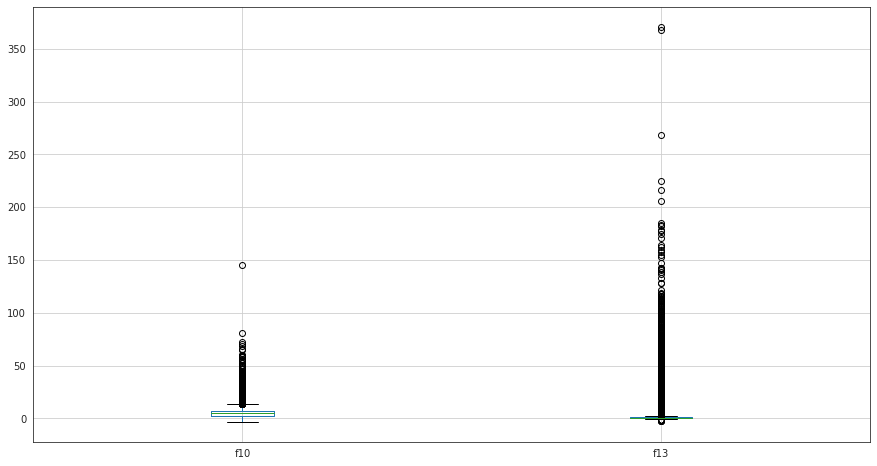

In [257]:
train_imputed.boxplot(['f10', 'f13'], figsize=(15,8))

In [303]:
train_outliers_1 = train_imputed[train_imputed.f10<50]
find_skew(train_outliers['f10'])

'sample lenght: 49980   and skew: 1.8983107365083447'

In [304]:
train_outliers_2 = train_outliers_1[train_outliers_1.f13<50]
find_skew(train_outliers_2.f13)

'sample lenght: 49690   and skew: 4.465692760637752'

In [305]:
train_outliers = train_outliers_2.copy()

# Feature transformation

In [315]:
train_transformed = train_outliers.copy()
test_transformed = test_imputed.copy()

In [317]:
train_transformed.describe()

,id,target,f0,f1,f2,f3,f5,f6,f7,f9,...,f21_dbd,f21_dnd,f21_n,f21_nd,f21_nnd,f21_nnx,f21_nx,f21_x,f21_xbx,f21_xnx
count,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,...,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000,49690.000000
mean,24995.430509,0.222338,1017.717521,23.504931,5.018890,16.954601,7.470026,39.651454,13.881092,0.218923,...,0.054498,0.052928,0.058845,0.064258,0.062910,0.051036,0.057235,0.057718,0.050654,0.048038
std,14438.589267,0.415822,6.774958,14.012968,0.007094,6.530071,3.268211,13.505072,8.916947,0.411366,...,0.227000,0.223892,0.235336,0.245215,0.242804,0.220074,0.232293,0.233211,0.219292,0.213848
min,0.000000,0.000000,982.000000,0.000000,4.998000,-6.200000,-0.850239,7.000000,-5.958606,-0.131136,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,12490.250000,0.000000,1013.600000,11.000000,5.014100,12.200000,5.273000,30.000000,7.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,24993.500000,0.000000,1017.700000,23.000000,5.019000,16.700000,7.773710,37.000000,13.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,37497.750000,0.000000,1021.900000,35.000000,5.023900,21.500000,9.994390,47.102551,19.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,49999.000000,1.000000,1040.900000,48.000000,5.045800,39.100000,15.492052,130.000000,87.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


f12_dec has very big values, so we will transform this feature to logarithmic scale.
f0 has all its values around 1000, so I will take the difference of x - 1000 as the new feature.
f2 has all its values around 5, so same here: x - 5

In [318]:
train_transformed['f12_dec'] = np.log(train_transformed['f12_dec'])
train_transformed['f0'] = train_transformed['f0'] - 1000
train_transformed['f2'] = train_transformed['f0'] - 5

In [319]:
test_transformed['f12_dec'] = np.log(test_transformed['f12_dec'])
test_transformed['f0'] = test_transformed['f0'] - 1000
test_transformed['f2'] = test_transformed['f0'] - 5

In [320]:
train_transformed = train_transformed.drop_duplicates()
train_transformed.shape

(49690, 86)

In [321]:
test_transformed.shape

(50000, 85)

# Split the training data

In [325]:
# split data into train and test sets
seed = 7
test_size = 0.33

y = train_transformed["target"].values
train_cleaned = train_transformed.drop('target', axis=1)
X_train, X_test, y_train, y_test = train_test_split(train_cleaned, y, test_size=test_size, random_state=seed)

# Resampling

In [328]:
def plot_2d_space(X, y, label='Classes'):   
    colors = ['#1F77B4', '#FF7F0E']
    markers = ['o', 's']
    for l, c, m in zip(np.unique(y), colors, markers):
        plt.scatter(
            X[y==l, 0],
            X[y==l, 1],
            c=c, label=l, marker=m
        )
    plt.title(label)
    plt.legend(loc='upper right')
    plt.show()

In [334]:
from imblearn.over_sampling import SMOTE

smote = SMOTE()
X_sm, y_sm = smote.fit_sample(X_train, y_train)

# Modelling

## Baseline models

Guess random class

In [338]:
from sklearn.dummy import DummyClassifier

random_clf = DummyClassifier(strategy='uniform', random_state=seed)
random_clf.fit(X_train, y_train)
predictions = random_clf.predict(X_test)
score = random_clf.score(X_test, y_test)
score

0.495670203683376

Guess the most frequent target

In [345]:
zero_rule_clf = DummyClassifier(strategy='most_frequent', random_state=seed)
zero_rule_clf.fit(X_train, y_train)
predictions = zero_rule_clf.predict(X_test)
score = zero_rule_clf.score(X_test, y_test)

print("Prediction score:", score) 

# See the actual number of different labels, to check that the score makes sense
print("\nValue counts:")
print(pd.DataFrame(y_train).value_counts())
print(pd.DataFrame(y_test).value_counts())

Prediction score: 0.7777167947310648

Value counts:
0.0    25889
1.0     7403
dtype: int64
0.0    12753
1.0     3645
dtype: int64


## xgboost model

In [346]:
import xgboost as xgb
from sklearn import metrics
from sklearn.model_selection import GridSearchCV

def auc(m, train, test): 
    return (metrics.roc_auc_score(y_tr,m.predict_proba(train)[:,1]),
                            metrics.roc_auc_score(y_te,m.predict_proba(test)[:,1]))

In [ ]:
# Parameter Tuning
model = xgb.XGBClassifier()
param_dist = {"max_depth": [10,30,50],
              "min_child_weight" : [1,3,6],
              "n_estimators": [200],
              "learning_rate": [0.05, 0.1,0.16],}
grid_search = GridSearchCV(model, param_grid=param_dist, cv = 3, 
                                   verbose=10, n_jobs=-1)
grid_search.fit(X_sm, y_sm)

grid_search.best_estimator_

Fitting 3 folds for each of 27 candidates, totalling 81 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:  1.3min


After running grid search, and training the model with the different parameters, I found  that the best parameters were:
- learning rate: 0.05
- max depth: 10
- n estimatiors: 200
- min child weight: 6
- scale pos weight: 1

In [ ]:
model = xgb.XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.05, max_delta_step=0, max_depth=10,
              min_child_weight=6, monotone_constraints='()',
              n_estimators=500, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)
model.fit(X_sm, y_sm)

auc(model, X_sm, X_test)